## Data aumentation

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tensorflow

In [28]:
import os
import cv2
import numpy as np
import random

# Directorios
DATASET_DIR = "/content/drive/MyDrive/Proyecto ML/combined_dataset"  # Cambia esta ruta a tu dataset
IMAGES_DIR = os.path.join(DATASET_DIR, "images")
LABELS_DIR = os.path.join(DATASET_DIR, "labels")
OUTPUT_DIR = "/content/drive/MyDrive/Proyecto ML/augmented_dataset"

# Asegurar salida
AUG_IMAGES_DIR = os.path.join(OUTPUT_DIR, "images")
AUG_LABELS_DIR = os.path.join(OUTPUT_DIR, "labels")

In [29]:
import os
import cv2
import numpy as np
import random

# Directorios
DATASET_DIR = "/content/drive/MyDrive/Proyecto ML/combined_dataset"  # Cambia esta ruta a tu dataset
IMAGES_DIR = os.path.join(DATASET_DIR, "images")
LABELS_DIR = os.path.join(DATASET_DIR, "labels")
OUTPUT_DIR = "/content/drive/MyDrive/Proyecto ML/augmented_dataset"

# Asegurar salida
AUG_IMAGES_DIR = os.path.join(OUTPUT_DIR, "images")
AUG_LABELS_DIR = os.path.join(OUTPUT_DIR, "labels")
os.makedirs(AUG_IMAGES_DIR, exist_ok=True)
os.makedirs(AUG_LABELS_DIR, exist_ok=True)

def ajustar_bounding_boxes(old_bbox, transform_matrix, img_shape):
    """
    Ajusta los bounding boxes aplicando la matriz de transformación de la imagen.
    """
    h, w = img_shape[:2]
    new_bbox = []
    for bbox in old_bbox:
        cx, cy, bw, bh = bbox  # formato YOLO: centro_x, centro_y, ancho, alto
        x1, y1 = (cx - bw / 2) * w, (cy - bh / 2) * h
        x2, y2 = (cx + bw / 2) * w, (cy + bh / 2) * h

        points = np.array([[x1, y1], [x2, y2]], dtype=np.float32)
        new_points = cv2.transform(np.array([points]), transform_matrix)[0]

        nx1, ny1 = new_points[0]
        nx2, ny2 = new_points[1]

        ncx, ncy = (nx1 + nx2) / 2 / w, (ny1 + ny2) / 2 / h
        nbw, nbh = (nx2 - nx1) / w, (ny2 - ny1) / h

        new_bbox.append([ncx, ncy, nbw, nbh])

    return new_bbox

# Procesar imágenes y etiquetas
for image_file in os.listdir(IMAGES_DIR):
    if not image_file.endswith(('.jpg', '.png', '.jpeg')):
        continue

    img_path = os.path.join(IMAGES_DIR, image_file)
    label_path = os.path.join(LABELS_DIR, os.path.splitext(image_file)[0] + ".txt")

    # Cargar imagen y etiquetas
    img = cv2.imread(img_path)
    h, w, _ = img.shape

    if not os.path.exists(label_path):
        continue

    with open(label_path, "r") as f:
        labels = [line.strip().split() for line in f.readlines()]

    # Transformar labels al formato de coordenadas YOLO (x_centro, y_centro, w, h)
    bounding_boxes = [[float(x) for x in label[1:]] for label in labels]

    # Generar 5 variantes aumentadas por imagen
    for i in range(5):
        # Definir una transformación aleatoria (rotación, traslación, escala, etc.)
        angle = random.uniform(-25, 25)  # Rotación aleatoria entre -25 y 25 grados
        scale = random.uniform(0.8, 1.2)  # Escala aleatoria entre 0.8 y 1.2
        tx = random.uniform(-0.2 * w, 0.2 * w)  # Traslación aleatoria en x
        ty = random.uniform(-0.2 * h, 0.2 * h)  # Traslación aleatoria en y

        # Crear la matriz de transformación
        transform_matrix = cv2.getRotationMatrix2D((w / 2, h / 2), angle, scale)
        transform_matrix[:, 2] += [tx, ty]  # Añadir traslación

        # Aplicar la transformación a la imagen
        augmented_img = cv2.warpAffine(img, transform_matrix, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)

        # Ajustar las bounding boxes
        adjusted_bboxes = ajustar_bounding_boxes(bounding_boxes, transform_matrix, (h, w))

        # Crear la etiqueta correspondiente
        augmented_label = []
        for lbl, bbox in zip(labels, adjusted_bboxes):
            augmented_label.append(f"{lbl[0]} {' '.join(map(str, bbox))}")

        # Guardar imagen aumentada
        aug_image_filename = f"{os.path.splitext(image_file)[0]}_aug_{i}.jpg"
        cv2.imwrite(os.path.join(AUG_IMAGES_DIR, aug_image_filename), augmented_img)

        # Guardar etiqueta YOLO correspondiente
        aug_label_filename = f"{os.path.splitext(image_file)[0]}_aug_{i}.txt"
        with open(os.path.join(AUG_LABELS_DIR, aug_label_filename), "w") as f:
            f.write("\n".join(augmented_label))

## Mostrando imagenes

In [30]:
import matplotlib.pyplot as plt
def dibujar_bounding_boxes(img, bboxes, color=(0, 255, 0), thickness=2):
    """
    Dibuja las bounding boxes en la imagen.
    """
    h, w, _ = img.shape
    for bbox in bboxes:
        cx, cy, bw, bh = bbox
        x1 = int((cx - bw / 2) * w)
        y1 = int((cy - bh / 2) * h)
        x2 = int((cx + bw / 2) * w)
        y2 = int((cy + bh / 2) * h)
        cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)
    return img

In [31]:
def mostrar_imagenes_con_etiquetas(aug_images_dir, aug_labels_dir, num_imagenes=20):
    """
    Muestra las primeras `num_imagenes` imágenes con sus etiquetas YOLO.
    """
    image_files = sorted(os.listdir(aug_images_dir))[:num_imagenes]
    for image_file in image_files:
        # Cargar imagen
        img_path = os.path.join(aug_images_dir, image_file)
        img = cv2.imread(img_path)

        # Verificar si la imagen se cargó correctamente
        if img is None:
            print(f"Error: No se pudo cargar la imagen {img_path}. Verifica la ruta o el archivo.")
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir a RGB para matplotlib

        # Cargar etiquetas
        label_path = os.path.join(aug_labels_dir, os.path.splitext(image_file)[0] + ".txt")
        if not os.path.exists(label_path):
            print(f"Advertencia: No se encontró el archivo de etiqueta {label_path}.")
            continue

        with open(label_path, "r") as f:
            labels = [line.strip().split() for line in f.readlines()]

        # Convertir etiquetas a bounding boxes
        bboxes = [[float(x) for x in label[1:]] for label in labels]

        # Dibujar bounding boxes en la imagen
        img_con_bboxes = dibujar_bounding_boxes(img, bboxes)

        # Mostrar la imagen con matplotlib
        plt.figure(figsize=(8, 8))
        plt.imshow(img_con_bboxes)
        plt.title(f"Imagen: {image_file}")
        plt.axis("off")
        plt.show()

/content/drive/MyDrive/Proyecto ML/augmented_dataset/images /content/drive/MyDrive/Proyecto ML/augmented_dataset/labels


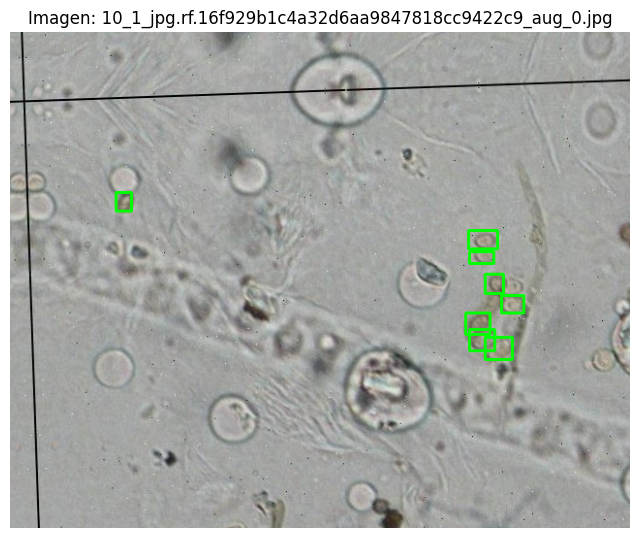

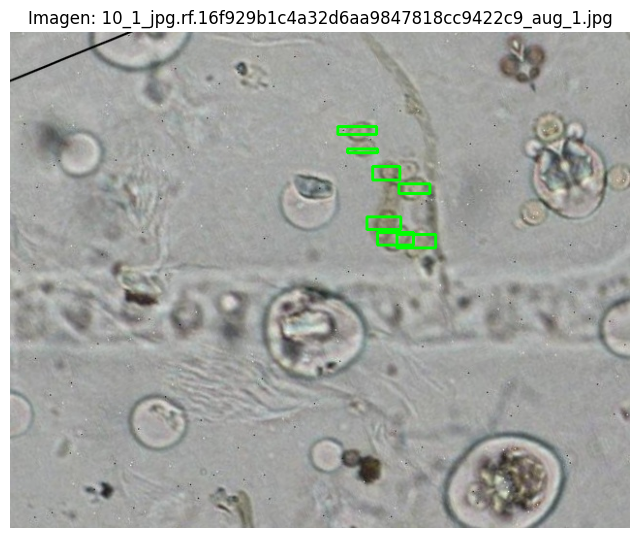

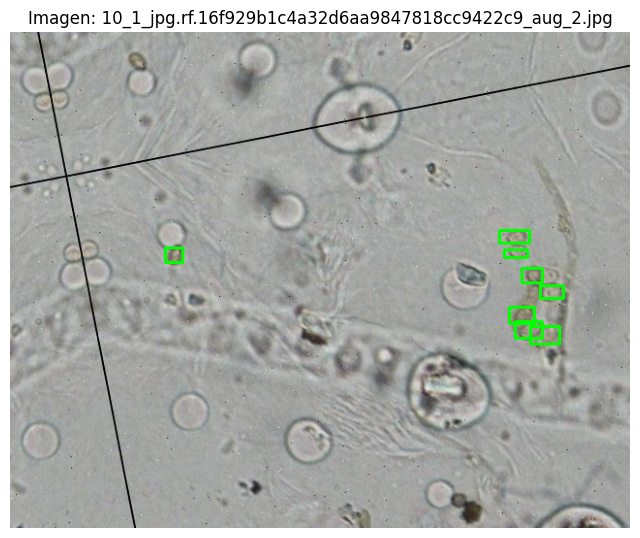

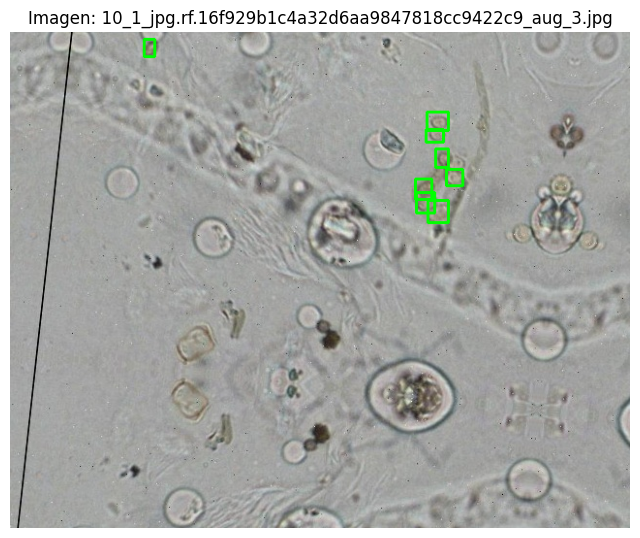

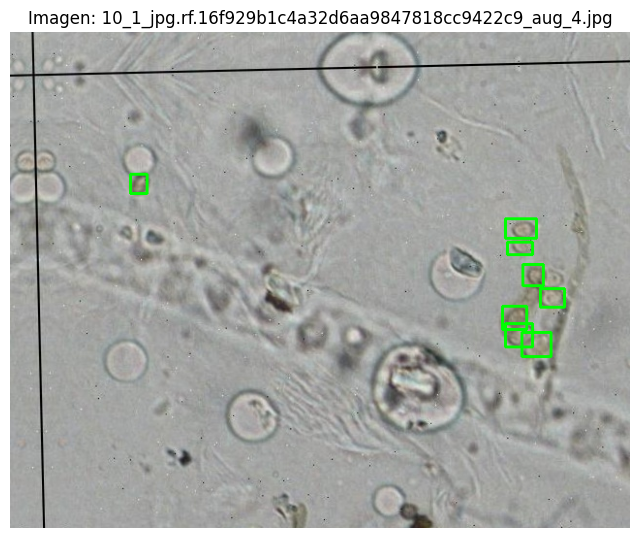

...

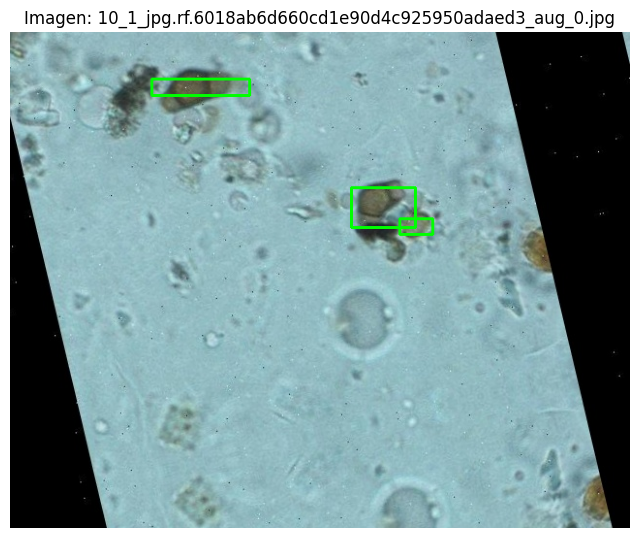

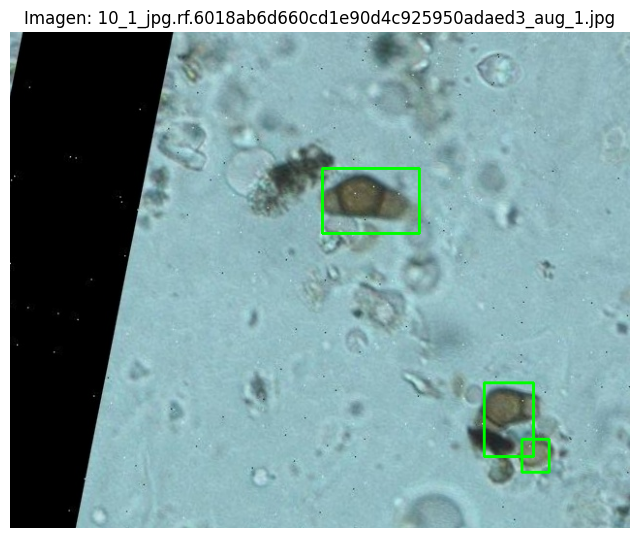

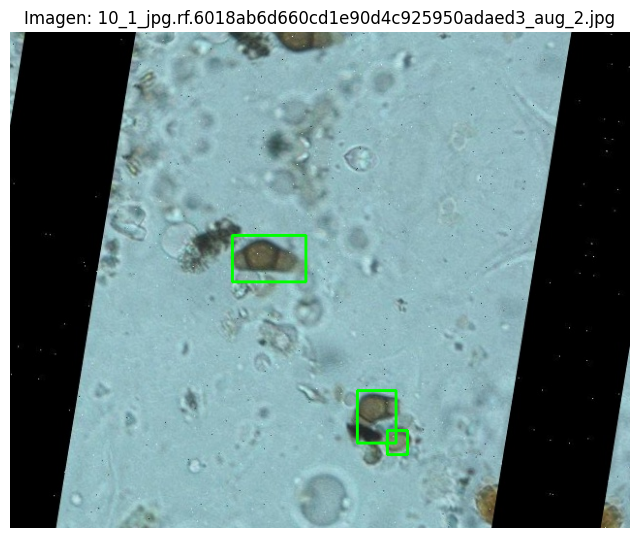

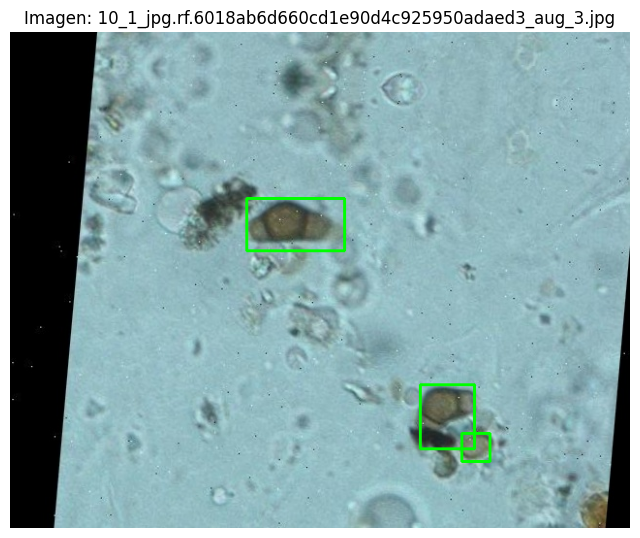

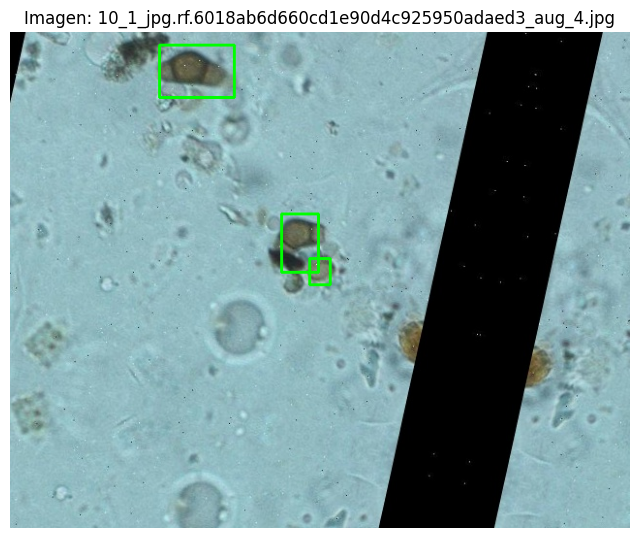

In [32]:
AUG_IMAGES_DIR = os.path.join(OUTPUT_DIR, "images")
AUG_LABELS_DIR = os.path.join(OUTPUT_DIR, "labels")

print(AUG_IMAGES_DIR, AUG_LABELS_DIR)

mostrar_imagenes_con_etiquetas(AUG_IMAGES_DIR, AUG_LABELS_DIR, num_imagenes=20)